In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
raw_data = pd.read_csv('Reviews.csv')

In [3]:
raw_data

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...
...,...,...,...,...,...,...,...,...,...,...
568449,568450,B001EO7N10,A28KG5XORO54AY,Lettie D. Carter,0,0,5,1299628800,Will not do without,Great for sesame chicken..this is a good if no...
568450,568451,B003S1WTCU,A3I8AFVPEE8KI5,R. Sawyer,0,0,2,1331251200,disappointed,I'm disappointed with the flavor. The chocolat...
568451,568452,B004I613EE,A121AA1GQV751Z,"pksd ""pk_007""",2,2,5,1329782400,Perfect for our maltipoo,"These stars are small, so you can give 10-15 o..."
568452,568453,B004I613EE,A3IBEVCTXKNOH,"Kathy A. Welch ""katwel""",1,1,5,1331596800,Favorite Training and reward treat,These are the BEST treats for training and rew...


In [4]:
raw_data.isnull().any()

Id                        False
ProductId                 False
UserId                    False
ProfileName                True
HelpfulnessNumerator      False
HelpfulnessDenominator    False
Score                     False
Time                      False
Summary                    True
Text                      False
dtype: bool

In [5]:
data_no_null = raw_data.copy()
data_no_null = data_no_null.dropna()
data_no_null.isnull().any()

Id                        False
ProductId                 False
UserId                    False
ProfileName               False
HelpfulnessNumerator      False
HelpfulnessDenominator    False
Score                     False
Time                      False
Summary                   False
Text                      False
dtype: bool

In [6]:
data_no_null

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...
...,...,...,...,...,...,...,...,...,...,...
568449,568450,B001EO7N10,A28KG5XORO54AY,Lettie D. Carter,0,0,5,1299628800,Will not do without,Great for sesame chicken..this is a good if no...
568450,568451,B003S1WTCU,A3I8AFVPEE8KI5,R. Sawyer,0,0,2,1331251200,disappointed,I'm disappointed with the flavor. The chocolat...
568451,568452,B004I613EE,A121AA1GQV751Z,"pksd ""pk_007""",2,2,5,1329782400,Perfect for our maltipoo,"These stars are small, so you can give 10-15 o..."
568452,568453,B004I613EE,A3IBEVCTXKNOH,"Kathy A. Welch ""katwel""",1,1,5,1331596800,Favorite Training and reward treat,These are the BEST treats for training and rew...


In [7]:
import plotly.express as px
hist_score = px.histogram(data_no_null, x="Score")
hist_score.update_traces(marker_color="green",marker_line_color='rgb(8,48,107)',marker_line_width=1.5)
hist_score.show()

In [8]:
import re
import string

def clean_text_1(text):
    text = text.lower()
    text = re.sub('\[.*?]', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [9]:
step1_clean = lambda x: clean_text_1(x)

In [10]:
data_clean = pd.DataFrame(data_no_null['Text'].apply(step1_clean))

In [11]:
data_clean

,Text
0,i have bought several of the vitality canned d...
1,product arrived labeled as jumbo salted peanut...
2,this is a confection that has been around a fe...
3,if you are looking for the secret ingredient i...
4,great taffy at a great price there was a wide...
...,...
568449,great for sesame chickenthis is a good if not ...
568450,im disappointed with the flavor the chocolate ...
568451,these stars are small so you can give of thos...
568452,these are the best treats for training and rew...


In [12]:
data_clean['Score'] = data_no_null['Score']

In [13]:
data_clean

,Text,Score
0,i have bought several of the vitality canned d...,5
1,product arrived labeled as jumbo salted peanut...,1
2,this is a confection that has been around a fe...,4
3,if you are looking for the secret ingredient i...,2
4,great taffy at a great price there was a wide...,5
...,...,...
568449,great for sesame chickenthis is a good if not ...,5
568450,im disappointed with the flavor the chocolate ...,2
568451,these stars are small so you can give of thos...,5
568452,these are the best treats for training and rew...,5


In [14]:
data_corpus = data_clean.copy()
#data_corpus é o corpus


In [15]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(stop_words='english')
data_cv = cv.fit_transform(data_corpus['Text'])
#data_cv é a dtm (document-term-matrix)

In [16]:
all_text = " ".join(review for review in data_corpus['Text'])

In [17]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from wordcloud import WordCloud


[nltk_data] Downloading package stopwords to C:\Users\William
[nltk_data]     Ausenka\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [18]:
stop_words = set(stopwords.words('english')) 
wc = WordCloud(stopwords=stop_words, background_color='white',colormap='Dark2',max_font_size=150, random_state=42)

In [19]:
wc.generate(all_text)

<function matplotlib.pyplot.show(close=None, block=None)>

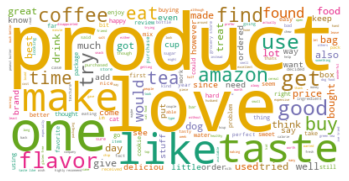

In [20]:
plt.imshow(wc,interpolation='bilinear')
plt.axis('off')
plt.show

In [21]:
from textblob import TextBlob

pol = lambda x: TextBlob(x).sentiment.polarity

data_sentiment = data_corpus.copy()

data_sentiment['Sentiment'] = data_sentiment['Text'].apply(pol)

In [22]:
data_sentiment

,Text,Score,Sentiment
0,i have bought several of the vitality canned d...,5,0.450000
1,product arrived labeled as jumbo salted peanut...,1,-0.033333
2,this is a confection that has been around a fe...,4,0.133571
3,if you are looking for the secret ingredient i...,2,0.166667
4,great taffy at a great price there was a wide...,5,0.483333
...,...,...,...
568449,great for sesame chickenthis is a good if not ...,5,0.365000
568450,im disappointed with the flavor the chocolate ...,2,-0.250000
568451,these stars are small so you can give of thos...,5,-0.021875
568452,these are the best treats for training and rew...,5,0.521429


In [24]:
data_sentiment['round_sentiment'] = data_sentiment['Sentiment'].apply(lambda x : +1 if x > 0 else -1)

In [25]:
data_sentiment

,Text,Score,Sentiment,round_sentiment
0,i have bought several of the vitality canned d...,5,0.450000,1
1,product arrived labeled as jumbo salted peanut...,1,-0.033333,-1
2,this is a confection that has been around a fe...,4,0.133571,1
3,if you are looking for the secret ingredient i...,2,0.166667,1
4,great taffy at a great price there was a wide...,5,0.483333,1
...,...,...,...,...
568449,great for sesame chickenthis is a good if not ...,5,0.365000,1
568450,im disappointed with the flavor the chocolate ...,2,-0.250000,-1
568451,these stars are small so you can give of thos...,5,-0.021875,-1
568452,these are the best treats for training and rew...,5,0.521429,1


<AxesSubplot:xlabel='Sentiment', ylabel='Count'>

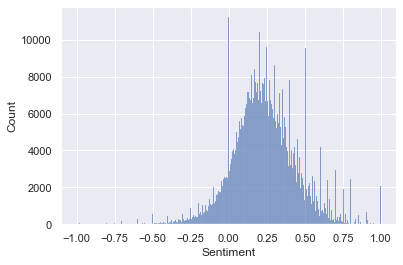

In [26]:
sns.histplot(data_sentiment['Sentiment'])

In [27]:
positive = data_sentiment[data_sentiment['Sentiment']>0]
negative = data_sentiment[data_sentiment['Sentiment']<0]

In [28]:
all_text_positive = " ".join(review for review in positive['Text'])
all_text_negative = " ".join(review for review in negative['Text'])
stop_words.update(["good","great"]) 

<function matplotlib.pyplot.show(close=None, block=None)>

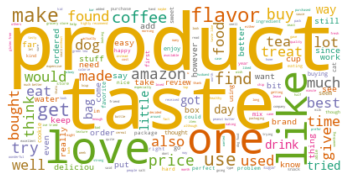

In [29]:
wc_positive = WordCloud(stopwords=stop_words, background_color='white',colormap='Dark2',max_font_size=150, random_state=42)
wc_positive.generate(all_text_positive)
plt.imshow(wc_positive,interpolation='bilinear')
plt.axis('off')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

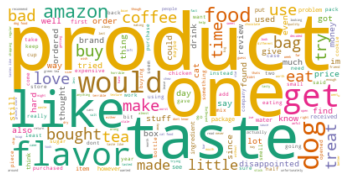

In [30]:
wc_negative = WordCloud(stopwords=stop_words, background_color='white',colormap='Dark2',max_font_size=150, random_state=42)
wc_negative.generate(all_text_negative)
plt.imshow(wc_negative,interpolation='bilinear')
plt.axis('off')
plt.show

In [51]:
positive_2 = data_sentiment[data_sentiment['Sentiment'] > 0.2]

<function matplotlib.pyplot.show(close=None, block=None)>

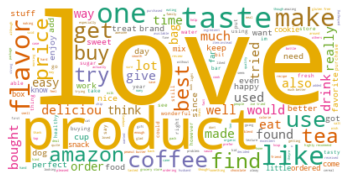

In [52]:
all_text_positive_2 = " ".join(review for review in positive_2['Text'])
wc_positive_2 = WordCloud(stopwords=stop_words, background_color='white',colormap='Dark2',max_font_size=150, random_state=42)
wc_positive_2.generate(all_text_positive_2)
plt.imshow(wc_positive_2,interpolation='bilinear')
plt.axis('off')
plt.show

In [31]:
negative_2 = data_sentiment[data_sentiment['Sentiment']< -0.1]

<function matplotlib.pyplot.show(close=None, block=None)>

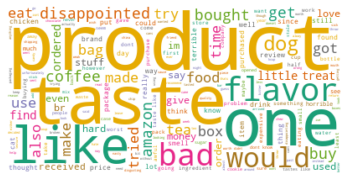

In [32]:
all_text_negative_2 = " ".join(review for review in negative_2['Text'])
wc_negative_2 = WordCloud(stopwords=stop_words, background_color='white',colormap='Dark2',max_font_size=150, random_state=42)
wc_negative_2.generate(all_text_negative_2)
plt.imshow(wc_negative_2,interpolation='bilinear')
plt.axis('off')
plt.show

In [33]:
tdm = data_cv.transpose()

In [34]:
tdm

<214299x568411 sparse matrix of type '<class 'numpy.int64'>'
	with 17324698 stored elements in Compressed Sparse Column format>

In [35]:
data_cv

<568411x214299 sparse matrix of type '<class 'numpy.int64'>'
	with 17324698 stored elements in Compressed Sparse Row format>

In [36]:
negative_2 = negative_2.drop(['Score', 'Sentiment', 'round_sentiment'], axis=1)

In [37]:
negative_2.reset_index()

,index,Text
0,14,the strawberry twizzlers are my guilty pleasur...
1,50,this oatmeal is not good its mushy soft i dont...
2,52,this wasnt in stock the last time i looked i h...
3,62,arrived in days and were so stale i could not...
4,69,this was sooooo deliscious but too bad i ate e...
...,...,...
26754,568334,i am a flight attendant and a couple of years ...
26755,568342,twice at least the salt of season kipper snack...
26756,568371,one of the very few if not the only mix that h...
26757,568410,my main reason for the five star review has to...


In [38]:
negative_2

,Text
14,the strawberry twizzlers are my guilty pleasur...
50,this oatmeal is not good its mushy soft i dont...
52,this wasnt in stock the last time i looked i h...
62,arrived in days and were so stale i could not...
69,this was sooooo deliscious but too bad i ate e...
...,...
568334,i am a flight attendant and a couple of years ...
568342,twice at least the salt of season kipper snack...
568371,one of the very few if not the only mix that h...
568410,my main reason for the five star review has to...


In [39]:
negative_2_data_cv = cv.fit_transform(negative_2['Text'])

In [40]:
negative_2_data_cv

<26759x28952 sparse matrix of type '<class 'numpy.int64'>'
	with 592009 stored elements in Compressed Sparse Row format>

In [41]:
negative_2_arr = negative_2_data_cv.toarray()

In [42]:
negative_2_arr_transpose = negative_2_arr.transpose()

In [43]:
from gensim import matutils, models
import scipy.sparse

D:\Anaconda\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning:

The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.



In [44]:
sparse_counts = scipy.sparse.csr_matrix(negative_2_arr_transpose)
corpus = matutils.Sparse2Corpus(sparse_counts)

In [45]:
id2word = dict((v,k) for k,v in cv.vocabulary_.items())

In [46]:
lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics = 2, passes=10)
lda.print_topics()

[(0,
  '0.017*"like" + 0.017*"taste" + 0.012*"product" + 0.010*"just" + 0.010*"coffee" + 0.009*"bad" + 0.009*"flavor" + 0.009*"disappointed" + 0.008*"tea" + 0.007*"buy"'),
 (1,
  '0.014*"food" + 0.013*"chicken" + 0.013*"dog" + 0.011*"br" + 0.011*"like" + 0.009*"eat" + 0.007*"product" + 0.007*"just" + 0.007*"treats" + 0.006*"dogs"')]

In [47]:
lda = models.LdaModel(corpus=corpus, id2word=id2word, num_topics = 3, passes=10)
lda.print_topics()

[(0,
  '0.025*"like" + 0.025*"taste" + 0.016*"coffee" + 0.015*"flavor" + 0.013*"tea" + 0.011*"just" + 0.011*"bad" + 0.008*"tastes" + 0.008*"br" + 0.008*"product"'),
 (1,
  '0.017*"product" + 0.013*"amazon" + 0.011*"disappointed" + 0.011*"box" + 0.008*"just" + 0.008*"order" + 0.008*"buy" + 0.008*"ordered" + 0.007*"bag" + 0.007*"received"'),
 (2,
  '0.018*"chicken" + 0.017*"food" + 0.016*"dog" + 0.011*"eat" + 0.011*"like" + 0.011*"br" + 0.009*"treats" + 0.008*"dogs" + 0.007*"loves" + 0.007*"just"')]